案例：airbnb

## 分析背景

Airbnb在全球拥有广泛丰富的用户出行场景。自身在APP和网页端以及通过各种营销渠道会收集到非常全面的用户行为数据。通过这些数据，锁定潜在的目标客群并制定相应的营销策略是Airbnb发展的重要基石。

## 分析目标

根据用户数据及消费行为数据
- 使用Python对客户进行聚类分群，并给出用户画像
- 通过数据，分析用户群体的核心特征

# 1 数据概况分析

## 1.1 数据预览

### 指标解释
- id: 唯一的用户id
- date_account_created: 用户注册日期
- date_first_booking: 第一次订房日期
- gender: 性别
- age: 年龄
- Married: 已婚
- Children: 小孩数量
- android: 曾在Android客户端预订
- moweb: 曾在手机移动网页预订
- web: 曾在电脑网页预订
- ios: 曾在iOS端预订
- Language_EN: 使用英文语言
- Language_Zh: 使用中文语言
- Country_US: 目的地是美国
- Country_EUR: 目的地是欧洲国家

In [1]:
#导入模块和数据
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

airbnb = pd.read_csv('airbnb.csv')
airbnb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67936 entries, 0 to 67935
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   age                   67936 non-null  int64 
 1   date_account_created  67936 non-null  object
 2   date_first_booking    67936 non-null  object
 3   gender                67936 non-null  object
 4   Language_EN           67936 non-null  int64 
 5   Language_ZH           67936 non-null  int64 
 6   Country_US            67936 non-null  int64 
 7   Country_EUR           67936 non-null  int64 
 8   android               67936 non-null  int64 
 9   moweb                 67936 non-null  int64 
 10  web                   67936 non-null  int64 
 11  ios                   67936 non-null  int64 
 12  Married               67936 non-null  int64 
 13  Children              67936 non-null  int64 
dtypes: int64(11), object(3)
memory usage: 7.3+ MB


In [11]:
airbnb.head()

,age,date_account_created,date_first_booking,gender,Language_EN,Language_ZH,Country_US,Country_EUR,android,moweb,web,ios,Married,Children
0,56,9/28/2010,8/2/2010,F,1,0,1,0,1,0,1,0,1,1
1,42,12/5/2011,9/8/2012,F,1,0,0,0,0,1,1,0,0,1
2,41,9/14/2010,2/18/2010,U,1,0,1,0,1,0,1,0,0,2
3,46,1/2/2010,1/5/2010,F,1,0,1,0,1,0,1,0,0,2
4,47,1/3/2010,1/13/2010,F,1,0,1,0,1,0,1,0,1,3


用户的个人信息：
- 发现日期变量：date_account_created, date_first_booking是object变量，需要调整
- 发现gender也是object变量，需要调整

# 2 单变量分析

## 2.1 数字型变量（age异常值的处理）

In [15]:
#查看数字型变量的核心指标
airbnb.describe()

,age,Language_EN,Language_ZH,Country_US,Country_EUR,android,moweb,web,ios,Married,Children
count,67936.000000,67936.000000,67936.000000,67936.000000,67936.000000,67936.000000,67936.000000,67936.000000,67936.000000,67936.000000,67936.000000
mean,47.874249,0.974476,0.005947,0.713907,0.159091,0.658355,0.340423,0.895828,0.067534,0.790155,1.536696
std,146.090906,0.157711,0.076886,0.451937,0.365764,0.474265,0.473855,0.305485,0.250947,0.407201,0.836273
min,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,28.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000
50%,33.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1.000000
75%,42.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,2.000000
max,2014.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.000000


In [ ]:
age最大值为2014显然是异常的，故数据需要清理

In [2]:
#假定使用airbnb的目标客群为18 - 80岁
airbnb = airbnb[airbnb['age'] >= 18]
airbnb = airbnb[airbnb['age'] <= 80]

airbnb['age'].describe()

count    66473.000000
mean        36.040483
std         10.963735
min         18.000000
25%         28.000000
50%         33.000000
75%         41.000000
max         80.000000
Name: age, dtype: float64

In [45]:
airbnb['age'].value_counts()

30    3614
31    3522
32    3445
29    3404
28    3376
      ... 
76      32
77      29
78      22
79      22
80      18
Name: age, Length: 63, dtype: int64

- 用户年龄分布在18 - 80岁，平均年龄为36岁，中位数为33岁。其中28 - 32岁用户为消费主体
- 说明年龄大的用户居多，所以拉开了整体数据分布

## 2.2 类别型变量

### 2.2.1 date的调整

- 常见操作1：将用户注册的年份提取
- 常见操作2：计算从用户注册到现在的时间，更加有价值
    - 第一步：将注册日期转变为日期时间的格式
    - 第二步：将年份从众提取出来，即用2020-注册日期的年份

In [3]:
#将注册日期转变为日期时间的格式
airbnb['date_account_created'] = pd.to_datetime(airbnb['date_account_created'])

airbnb.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 66473 entries, 0 to 67935
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   age                   66473 non-null  int64         
 1   date_account_created  66473 non-null  datetime64[ns]
 2   date_first_booking    66473 non-null  object        
 3   gender                66473 non-null  object        
 4   Language_EN           66473 non-null  int64         
 5   Language_ZH           66473 non-null  int64         
 6   Country_US            66473 non-null  int64         
 7   Country_EUR           66473 non-null  int64         
 8   android               66473 non-null  int64         
 9   moweb                 66473 non-null  int64         
 10  web                   66473 non-null  int64         
 11  ios                   66473 non-null  int64         
 12  Married               66473 non-null  int64         
 13  Children        

date_account_created的数据格式已转换为datetime64

In [4]:
#将年份从众提取出来，即用2020-注册日期的年份
airbnb['year_since_account_created'] = airbnb['date_account_created'].apply(lambda x: 2020 - x.year)

airbnb['year_since_account_created'].describe()

count    66473.000000
mean         7.035819
std          0.965431
min          6.000000
25%          6.000000
50%          7.000000
75%          8.000000
max         10.000000
Name: year_since_account_created, dtype: float64

In [67]:
airbnb['year_since_account_created'].value_counts()

7     25497
6     22469
8     13182
9      4307
10     1018
Name: year_since_account_created, dtype: int64

- 发现注册时间距今最短是6年，最长的是10年
- 注册时间多集中在6 - 7年

In [5]:
#同样方法处理date_first_booking
airbnb['date_first_booking'] = pd.to_datetime(airbnb['date_first_booking'])

airbnb['year_since_first_booking'] = airbnb['date_first_booking'].apply(lambda x: 2020 - x.year)

airbnb['year_since_first_booking'].describe()

count    66473.000000
mean         6.907481
std          0.995303
min          5.000000
25%          6.000000
50%          7.000000
75%          7.000000
max         10.000000
Name: year_since_first_booking, dtype: float64

- 发现第一次订房时间距今最短是5年，最长的是10年
- 这样的衍生变量在预测消费者购买能够更好得到潜在的效果

In [6]:
#既然已经将日期转变为了距今的年份，就可以将两个日期变量删除
airbnb.drop(airbnb.select_dtypes(['datetime64']), axis = 1, inplace = True)
airbnb.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 66473 entries, 0 to 67935
Data columns (total 14 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   age                         66473 non-null  int64 
 1   gender                      66473 non-null  object
 2   Language_EN                 66473 non-null  int64 
 3   Language_ZH                 66473 non-null  int64 
 4   Country_US                  66473 non-null  int64 
 5   Country_EUR                 66473 non-null  int64 
 6   android                     66473 non-null  int64 
 7   moweb                       66473 non-null  int64 
 8   web                         66473 non-null  int64 
 9   ios                         66473 non-null  int64 
 10  Married                     66473 non-null  int64 
 11  Children                    66473 non-null  int64 
 12  year_since_account_created  66473 non-null  int64 
 13  year_since_first_booking    66473 non-null  in

### 2.2.2 gender的调整

In [7]:
#对gender进行哑变量处理
airbnb = pd.get_dummies(airbnb)
airbnb.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 66473 entries, 0 to 67935
Data columns (total 16 columns):
 #   Column                      Non-Null Count  Dtype
---  ------                      --------------  -----
 0   age                         66473 non-null  int64
 1   Language_EN                 66473 non-null  int64
 2   Language_ZH                 66473 non-null  int64
 3   Country_US                  66473 non-null  int64
 4   Country_EUR                 66473 non-null  int64
 5   android                     66473 non-null  int64
 6   moweb                       66473 non-null  int64
 7   web                         66473 non-null  int64
 8   ios                         66473 non-null  int64
 9   Married                     66473 non-null  int64
 10  Children                    66473 non-null  int64
 11  year_since_account_created  66473 non-null  int64
 12  year_since_first_booking    66473 non-null  int64
 13  gender_F                    66473 non-null  uint8
 14  gender

# 3 相关和可视化

## 3.1 观察age与其他用户个人信息的相关关系

In [56]:
set1 = airbnb[['age', 'Children', 'Married', 'Language_EN', 'Country_US']]
set1.corr()

,age,Children,Married,Language_EN,Country_US
age,1.000000,0.095667,0.042270,0.057721,-0.026222
Children,0.095667,1.000000,0.044594,0.011395,0.019058
Married,0.042270,0.044594,1.000000,0.002781,0.001530
Language_EN,0.057721,0.011395,0.002781,1.000000,0.005160
Country_US,-0.026222,0.019058,0.001530,0.005160,1.000000


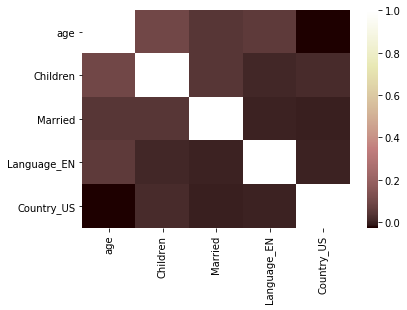

In [59]:
sns.heatmap(set1.corr(), cmap = 'pink')

- 用户的age与使用英语且家中小孩较多的变量成正相关关系，说明Airbnb在age越大，英语使用频率高和小孩较多的家庭中比较受欢迎
- 但age与目的地是美国的变量成负相关关系，说明用户age越大，越可能去美国之外的国家使用Airbnb
- age与其他用户个人信息的相关关系都太弱，对后续分析意义不大

## 3.2 观察age与用户下单渠道和性别的相关关系

In [61]:
set2 = airbnb[['age', 'android', 'moweb', 'web', 'ios', 'gender_F', 'gender_M']]
set2.corr()

,age,android,moweb,web,ios,gender_F,gender_M
age,1.000000,0.079089,-0.078795,0.089291,-0.073365,-0.045750,0.025568
android,0.079089,1.000000,-0.997242,0.022491,-0.035327,-0.070349,-0.156132
moweb,-0.078795,-0.997242,1.000000,-0.014833,0.036069,0.071656,0.156145
web,0.089291,0.022491,-0.014833,1.000000,-0.790675,0.022285,-0.017945
ios,-0.073365,-0.035327,0.036069,-0.790675,1.000000,-0.025997,0.029723
gender_F,-0.045750,-0.070349,0.071656,0.022285,-0.025997,1.000000,-0.705323
gender_M,0.025568,-0.156132,0.156145,-0.017945,0.029723,-0.705323,1.000000


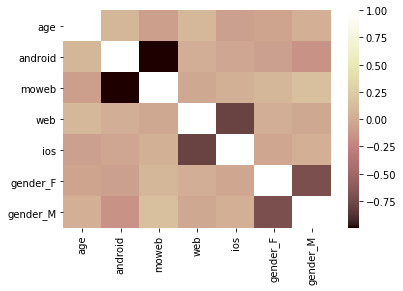

In [64]:
sns.heatmap(set2.corr(), cmap = 'pink')

- 随着age增加，用户会越倾向于在web上下单
- age越大的用户，越倾向于用Android上下单；而age越小的用户，越倾向于用iOS下单
- 男性用户更喜欢在H5推送界面上下单，并且他们不喜欢在Android上下单
- age与用户下单渠道和性别的相关关系都太弱，对后续分析意义不大

# 4 模型的建立与评估

## 4.1 模型建立

### 选择基于用户的行为偏好以及用户个人信息的考量：
- android, moweb, web, ios反映了客户的行为偏好
- age是用户个人信息的变量

In [8]:
#将5个指标存放进新的变量中，方便后续调用
airbnb_5 = airbnb[['age', 'android', 'moweb', 'web', 'ios']]

In [9]:
#导入sklearn中的预处理scale
from sklearn.preprocessing import scale
#用scale处理完后，标准化airbnb中的数据，并存进变量x
x = pd.DataFrame(scale(airbnb_5))

In [10]:
#使用cluster建模，先尝试分为3组
from sklearn import cluster
model = cluster.KMeans(n_clusters = 3, random_state = 10)
model.fit(x)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=3, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=10, tol=0.0001, verbose=0)

In [17]:
#提取标签，查看分类结果
airbnb_5['cluster'] = model.labels_
airbnb_5.head(10)

,age,android,moweb,web,ios,cluster
0,56,1,0,1,0,1
1,42,0,1,1,0,0
2,41,1,0,1,0,1
3,46,1,0,1,0,1
4,47,1,0,1,0,1
5,50,1,0,1,0,1
6,46,1,0,1,0,1
7,36,1,0,1,0,1
8,33,1,0,1,0,1
9,31,1,0,1,0,1


## 4.2 数据可视化，查看单变量维度分析结果

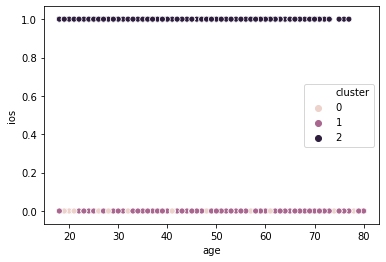

In [69]:
sns.scatterplot(x = 'age', y = 'ios', hue = 'cluster', data = airbnb_5)

- iOS只有0和1两个维度，故其可视化不佳

## 4.3 模型评估

In [22]:
#评估单变量维度分群效果
airbnb_5.groupby(['cluster'])['age'].describe()

,count,mean,std,min,25%,50%,75%,max
cluster,,,,,,,,
0,21093.0,35.061253,9.940771,18.0,28.0,33.0,39.0,80.0
1,40845.0,36.876215,11.581504,18.0,29.0,34.0,43.0,80.0
2,4535.0,33.067916,8.641708,18.0,27.0,31.0,37.0,77.0


- 发现3组用户的年龄分布都在18 - 80岁之间，说明age的区分度较弱

In [34]:
airbnb_5.groupby(['cluster'])['ios'].describe()

,count,mean,std,min,25%,50%,75%,max
cluster,,,,,,,,
0,21093.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,40845.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,4535.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0


- 0群和1群iOS为0，2群iOS大部分都为1，故iOS在群组中是一个很好的分群变量

In [35]:
from sklearn import metrics
#每一个变量x与之对应的群cluster的距离
x_cluster = model.fit_predict(x)
#将变量x与所在群进行比较，评分越高，个体与群越接近
score = metrics.silhouette_score(x, x_cluster)

print(score)

0.6335056609750385


In [37]:
#导出cluster_centers_
centers = pd.DataFrame(model.cluster_centers_)

print(centers)

          0         1         2         3         4
0 -0.089316 -1.375323  1.375436  0.228944 -0.270589
1  0.076228  0.724734 -0.725096  0.206204 -0.270589
2 -0.271129 -0.130558  0.133297 -2.922051  3.695642


- 列0, 1, 2, 3, 4分别对应age, android, moweb, web, ios（重点关注每一列的数据，找出abs较大的数字，结合业务理解进行判断）
- 0群和2群较为独特，下单渠道较为集中：
    - 0群喜欢用H5活动界面（如微信推送界面）下单，较少用android下单
    - 2群iOS重度用户，且很少使用web下单

## 4.4 模型优化（增加分群个数）

In [39]:
#使用cluster建模，分为5组
from sklearn import cluster
model = cluster.KMeans(n_clusters = 5, random_state = 10)
model.fit(x)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=5, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=10, tol=0.0001, verbose=0)

In [41]:
#导出cluster_centers_
centers = pd.DataFrame(model.cluster_centers_)
print(centers)

          0         1         2         3         4
0 -0.433590  0.727102 -0.725096  0.342225 -0.270589
1 -0.093553 -1.375323  1.379127  0.342225 -0.270589
2 -0.251366  0.053425 -0.122776 -2.922051 -0.270589
3 -0.271129 -0.130558  0.133297 -2.922051  3.695642
4  1.630809  0.708694 -0.706673  0.340277 -0.270589


- 年龄有变大的趋势
- 1群喜欢用H5活动界面（如微信推送界面）下单，较少用android下单
- 2群不喜欢用web下单
- 3群iOS重度用户，且很少使用web下单
- 4群年龄最大，但4群和0群数据区分度很小，对实际分析意义不大

# 5 业务解读

## 5.1 用户分析

- 用户年龄分布在18 - 80岁，平均年龄为36岁，中位数为33岁。其中28 - 32岁用户为消费主体
- 说明年龄大的用户居多，所以拉开了整体数据分布


- 注册时间距今最短是6年，最长的是10年
- 注册时间多集中在6 - 7年
- 第一次订房时间距今最短是5年，最长的是10年

## 5.2 提高客群区分度分析

- 用户的age与使用英语且家中小孩较多的变量成正相关关系，说明Airbnb在age越大，英语使用频率高和小孩较多的家庭中比较受欢迎
- 但age与目的地是美国的变量成负相关关系，说明用户age越大，越可能去美国之外的国家使用Airbnb


- 随着age增加，用户会越倾向于在web上下单
- age越大的用户，越倾向于用Android上下单；而age越小的用户，越倾向于用iOS下单
- 男性用户更喜欢在H5推送界面上下单，并且他们不喜欢在Android上下单

### 将用户分为5组后：
- 年龄有变大的趋势
- 1群喜欢用H5活动界面（如微信推送界面）下单，较少用android下单
- 2群不喜欢用web下单
- 3群iOS重度用户，且很少使用web下单

## 5.3 结论

- 重点留意28 - 32岁和注册时间在6 - 7年的Airbnb重度用户的留存情况，对响应度较低的客户制定相应的营销策略
- 对说英语、家中小孩较多的年龄较大的用户制定相应的活动或产品相应模型，比如推出周末家庭优惠游的套餐，尽量用最小的营销投入来最大化收益
- 对年龄较大的用户制定经济实惠的旅游路线和住宿计划，并可以提示通过推送下单有满减政策；对年龄较小的用户提供新颖刺激的旅游项目，并可以提示通过iOS客户端下单有一定优惠
- 对不同渠道的宣传和营销策划进行组间分析，观察两者的差异性，不断完善营销策略，有针对性地对不同客群实施相应的营销手段